In [141]:
import os
import librosa
import librosa.display
import IPython.display as ipd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.preprocessing import StandardScaler
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
from glob import glob
from itertools import cycle

In [35]:
def load_balanced_data_augmented(data_path, num_samples_per_class=3962, num_mfcc=20, augment=True):
    labels = []
    features = []
    
    for folder in os.listdir(data_path):
        label = folder
        folder_path = os.path.join(data_path, folder)
        
        if len(os.listdir(folder_path)) < num_samples_per_class:
            print(f"Not enough samples in {label}, skipping...")
            continue
        
        selected_files = np.random.choice(os.listdir(folder_path), num_samples_per_class, replace=False)
        
        for filename in selected_files:
            filepath = os.path.join(folder_path, filename)
            
            try:
                print(f"Loading file: {filepath}")
                
                audio_data, sr = librosa.load(filepath, sr=None)
                
                # Augmentacja
                if augment:
                    # Pitch shift
                    n_steps = np.random.uniform(-1.0, 2.0)  # Example pitch shift range
                    audio_data = librosa.effects.pitch_shift(audio_data, sr=sr, n_steps=n_steps)
                
                # Obliczanie MFCC
                mfccs = librosa.feature.mfcc(y=audio_data, sr=sr, n_mfcc=num_mfcc)
                
                if mfccs.shape[1] >= num_mfcc:
                    mfccs = mfccs[:, :num_mfcc]
                    
                    features.append(mfccs)
                    labels.append(label)
                else:
                    print(f"MFCC shape too short for {filepath}. Skipped.")
            
            except Exception as e:
                print(f"Error loading {filepath}: {e}")
                continue
    
    return features, labels

In [36]:
#Ścieżka do danych
data_path="C:/Users/filip/Documents/studia dell/6 semestr/sieci neuronowe 2/audioset/audioset-processing/output"
#ładowanie danych z bazy
features_augmented, labels_augmented = load_balanced_data_augmented(data_path, 3962)

Loading file: C:/Users/filip/Documents/studia dell/6 semestr/sieci neuronowe 2/audioset/audioset-processing/output\Brass instrument\AbPaeZseqDI_280.000.wav
Loading file: C:/Users/filip/Documents/studia dell/6 semestr/sieci neuronowe 2/audioset/audioset-processing/output\Brass instrument\taKWpFpzH6U_340.000.wav
Loading file: C:/Users/filip/Documents/studia dell/6 semestr/sieci neuronowe 2/audioset/audioset-processing/output\Brass instrument\VgL_ZnoGQcM_120.000.wav
Loading file: C:/Users/filip/Documents/studia dell/6 semestr/sieci neuronowe 2/audioset/audioset-processing/output\Brass instrument\gmeCzIEYfYo_170.000.wav
Loading file: C:/Users/filip/Documents/studia dell/6 semestr/sieci neuronowe 2/audioset/audioset-processing/output\Brass instrument\8jNCcneDmvE_230.000.wav
Loading file: C:/Users/filip/Documents/studia dell/6 semestr/sieci neuronowe 2/audioset/audioset-processing/output\Brass instrument\IckWaZ8QVIE_60.000.wav
Loading file: C:/Users/filip/Documents/studia dell/6 semestr/siec

In [37]:
# Konwersja list na tablice NumPy
features_augmented = np.array(features_augmented)
labels_augmented = np.array(labels_augmented)

# Konwersja etykiet na kodowanie one-hot
unique_labels = np.unique(labels_augmented)
label_to_index = {label: i for i, label in enumerate(unique_labels)}
y_augmented = tf.keras.utils.to_categorical([label_to_index[label] for label in labels_augmented])

# Podział danych na zbiory treningowy i testowy
X_train_augmented, X_test_augmented, y_train_augmented, y_test_augmented = train_test_split(features_augmented, y_augmented, test_size=0.2, random_state=42)

print("Liczba próbek w X_train (po augmentacji):", X_train_augmented.shape[0])
print("Liczba próbek w y_train (po augmentacji):", y_train_augmented.shape[0])

# Reshape X_train i X_test
X_train_augmented = X_train_augmented.reshape(X_train_augmented.shape[0], X_train_augmented.shape[1], X_train_augmented.shape[2], 1)
X_test_augmented = X_test_augmented.reshape(X_test_augmented.shape[0], X_test_augmented.shape[1], X_test_augmented.shape[2], 1)

# Upewnienie się, że X_train i y_train mają tę samą liczbę próbek
assert X_train_augmented.shape[0] == y_train_augmented.shape[0], "Liczba próbek w X_train i y_train nie jest taka sama po augmentacji."

print("Nowy kształt X_train po reshape:", X_train_augmented.shape)
print("Nowy kształt X_test po reshape:", X_test_augmented.shape)

Liczba próbek w X_train (po augmentacji): 15848
Liczba próbek w y_train (po augmentacji): 15848
Nowy kształt X_train po reshape: (15848, 20, 20, 1)
Nowy kształt X_test po reshape: (3962, 20, 20, 1)


In [59]:
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from keras.optimizers import Adam
from keras.regularizers import l2

# Inicjalizacja modelu
model = Sequential()

# Warstwy konwolucyjne
model.add(Conv1D(64, 3, activation='relu', input_shape=(20, 20)))
model.add(MaxPooling1D(2))
model.add(Conv1D(128, 3, activation='relu'))
model.add(MaxPooling1D(2))

# Warstwa Flatten
model.add(Flatten())

# Warstwy Dense
model.add(Dense(256, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dropout(0.5))
model.add(Dense(128, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dropout(0.5))

# Warstwa wyjściowa
model.add(Dense(5, activation='softmax'))

In [79]:
# Kompilacja modelu
from keras.metrics import Precision, Recall
optimizer = Adam(learning_rate=0.00001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy', Precision(), Recall()])

In [80]:
from keras.callbacks import EarlyStopping

# Uczenie modelu
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
history = model.fit(X_train_augmented, y_train_augmented, validation_data=(X_test_augmented, y_test_augmented), epochs=50, batch_size=2, callbacks=[early_stopping])

Epoch 1/50
7924/7924 [==============================] - 44s 5ms/step - loss: 0.9447 - accuracy: 0.6535 - precision: 0.7942 - recall: 0.5051 - val_loss: 1.3452 - val_accuracy: 0.5399 - val_precision: 0.6453 - val_recall: 0.3945
Epoch 2/50
7924/7924 [==============================] - 41s 5ms/step - loss: 0.9419 - accuracy: 0.6554 - precision: 0.7950 - recall: 0.5064 - val_loss: 1.3648 - val_accuracy: 0.5422 - val_precision: 0.6415 - val_recall: 0.4033
Epoch 3/50
7924/7924 [==============================] - 39s 5ms/step - loss: 0.9329 - accuracy: 0.6574 - precision: 0.7923 - recall: 0.5104 - val_loss: 1.3701 - val_accuracy: 0.5379 - val_precision: 0.6426 - val_recall: 0.4043
Epoch 4/50
7924/7924 [==============================] - 39s 5ms/step - loss: 0.9247 - accuracy: 0.6617 - precision: 0.7917 - recall: 0.5133 - val_loss: 1.3904 - val_accuracy: 0.5379 - val_precision: 0.6354 - val_recall: 0.4081
Epoch 5/50
7924/7924 [==============================] - 39s 5ms/step - loss: 0.9177 - accura

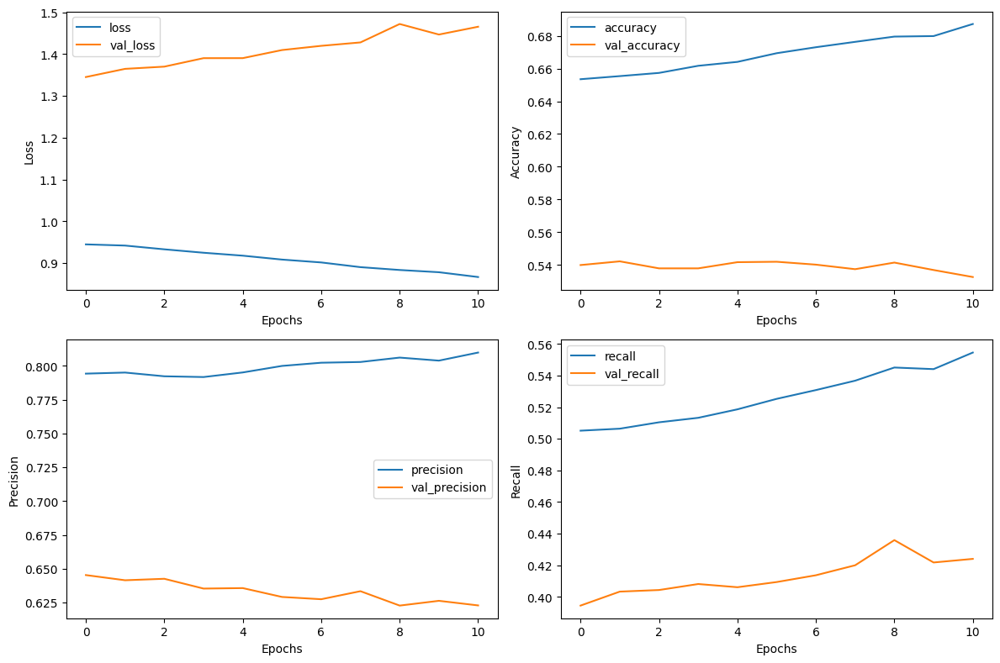

In [81]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='train accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.show()

124/124 [==============================] - 1s 4ms/step - loss: 1.3452 - accuracy: 0.5399 - precision: 0.6453 - recall: 0.3945
Test Loss: 1.3451589345932007
Test Accuracy: 0.5398788452148438
Test Precision: 0.6453344225883484
Test Recall: 0.39449772238731384
124/124 [==============================] - 0s 3ms/step


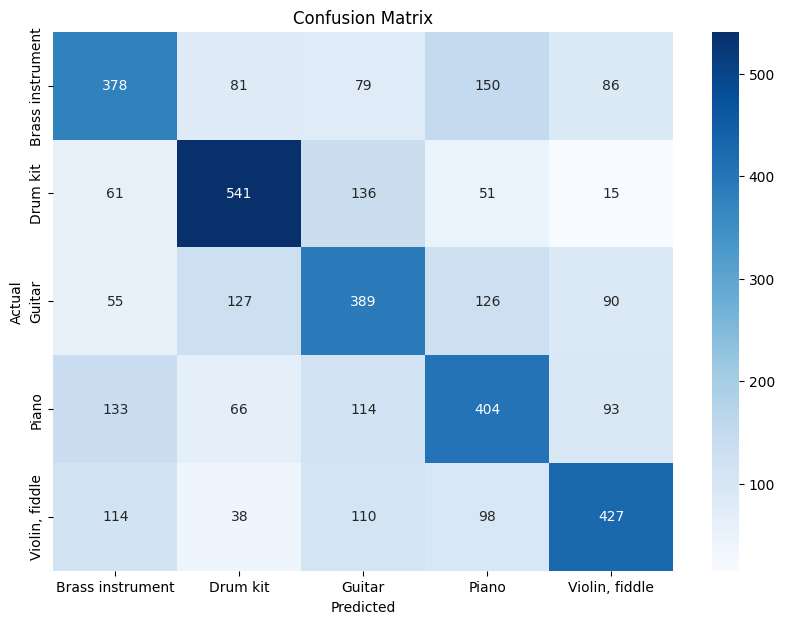

                  precision    recall  f1-score   support

Brass instrument       0.51      0.49      0.50       774
        Drum kit       0.63      0.67      0.65       804
          Guitar       0.47      0.49      0.48       787
           Piano       0.49      0.50      0.49       810
  Violin, fiddle       0.60      0.54      0.57       787

        accuracy                           0.54      3962
       macro avg       0.54      0.54      0.54      3962
    weighted avg       0.54      0.54      0.54      3962



In [98]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Ocena modelu na zbiorze testowym
metrics = model.evaluate(X_test_augmented, y_test_augmented)

# Wartości metryk
loss, accuracy, precision, recall = metrics

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")
print(f"Test Precision: {precision}")
print(f"Test Recall: {recall}")

# Predykcja na zbiorze testowym
y_pred_augmented = model.predict(X_test_augmented)

# Konwersja kodowania one-hot na etykiety klas dla y_test i y_pred
y_test_labels_augmented = np.argmax(y_test_augmented, axis=1)
y_pred_labels_augmented = np.argmax(y_pred_augmented, axis=1)

# Macierz pomyłek
cm = confusion_matrix(y_test_labels_augmented, y_pred_labels_augmented)
cm_df = pd.DataFrame(cm, index=unique_labels, columns=unique_labels)

# Wyświetlanie macierzy pomyłek
plt.figure(figsize=(10, 7))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Raport klasyfikacji
print(classification_report(y_test_labels_augmented, y_pred_labels_augmented, target_names=unique_labels))

In [174]:
def predict_instrument(model, audio_path, label_to_index):
    import librosa
    import numpy as np
    import matplotlib.pyplot as plt

    # Wczytanie pliku dźwiękowego
    audio_data, sr = librosa.load(audio_path, sr=None)

    # Sprawdzenie długości sygnału
    if len(audio_data) < 2048:
        raise ValueError("Plik audio jest zbyt krótki do analizy")

    # Przetwarzanie na MFCC
    mfccs = librosa.feature.mfcc(y=audio_data, sr=sr, n_mfcc=20)

    # Przekształcanie danych wejściowych dla modelu (dodanie wymiaru dla Conv2D)
    if mfccs.shape[1] < 20:
        raise ValueError("MFCC shape too short for analysis")
    mfccs_input = mfccs[:20, :20].reshape(1, 20, 20, 1)

    # Użycie modelu
    prediction = model.predict(mfccs_input)

    # Procentowe prawdopodobieństwa dla każdej klasy
    probabilities = prediction[0] * 100

    # Zaokrąglenie prawdopodobieństw do jednej cyfry po przecinku
    rounded_probabilities = np.round(probabilities, decimals=1)

    # Indeks klasy z najwyższym prawdopodobieństwem
    predicted_class_index = np.argmax(prediction)

    # Mapowanie indeksu na etykietę
    index_to_label = {v: k for k, v in label_to_index.items()}
    predicted_label = index_to_label[predicted_class_index]

    # Wykres z procentowymi prawdopodobieństwami
    plt.figure(figsize=(5,5))  # Zmniejsz rozmiar, aby uniknąć zasłaniania słupków

    # Stwórz słupki z zaokrąglonymi procentowymi prawdopodobieństwami
    bars = plt.bar(label_to_index.keys(), rounded_probabilities, color=plt.cm.Paired(np.arange(len(rounded_probabilities))))
    plt.xlabel('Instrumenty')
    plt.ylabel('Prawdopodobieństwo (%)')
    plt.title('Procentowe prawdopodobieństwa predykcji')
    plt.xticks(rotation=45)
    plt.tight_layout()

    # Dodanie wartości na słupkach z zaokrąglonymi wartościami
    for index, prob in enumerate(rounded_probabilities):
        plt.text(index, prob + 1, f'{prob:.1f}%', ha='center', va='bottom', fontsize=8, color='black')

    plt.show()

    return predicted_label

In [162]:
# Sprawdzenie kolejności klas w unique_labels
print("Kolejność klas w unique_labels:", unique_labels)

# Stworznie słownika mapującego etykiety na indeksy
label_to_index = {label: i for i, label in enumerate(unique_labels)}

Kolejność klas w unique_labels: ['Brass instrument' 'Drum kit' 'Guitar' 'Piano' 'Violin, fiddle']


1/1 [==============================] - 0s 41ms/step


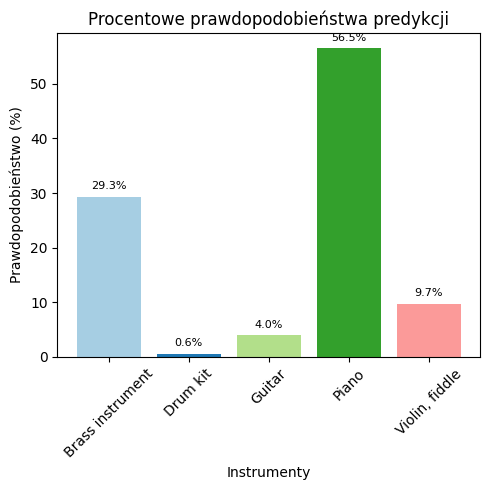

Przewidywany instrument: Piano


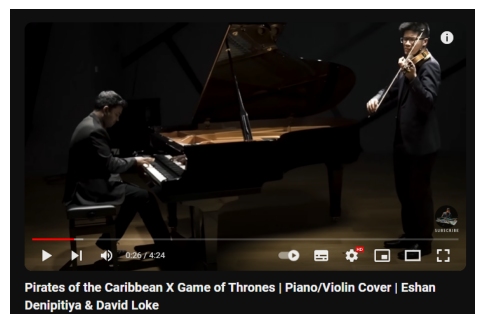

In [175]:
audio_path = "C:/Users/filip/Documents/Audacity/piano_violin_40-50s.wav"
predicted_label = predict_instrument(model, audio_path, label_to_index)
print(f"Przewidywany instrument: {predicted_label}")
plt.figure(figsize=(6, 4))
plt.imshow(plt.imread("piano and violin.png")); plt.axis('off'); plt.show()
audible=glob("C:/Users/filip/Documents/Audacity/piano_violin_40-50s.wav")
ipd.Audio(audible[0])

1/1 [==============================] - 0s 31ms/step


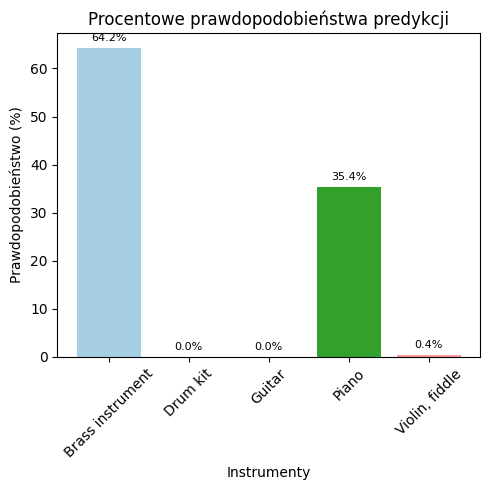

Przewidywany instrument: Brass instrument


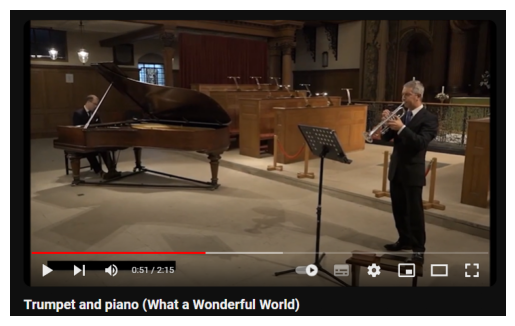

In [176]:
audio_path = "C:/Users/filip/Documents/Audacity/Trumpet and piano (What a Wonderful World)-11_21.wav"
predicted_label = predict_instrument(model, audio_path, label_to_index)
print(f"Przewidywany instrument: {predicted_label}")
plt.imshow(plt.imread("trumpet and piano.png")); plt.axis('off'); plt.show()
audible=glob("C:/Users/filip/Documents/Audacity/Trumpet and piano (What a Wonderful World)-11_21.wav")
ipd.Audio(audible[0])

1/1 [==============================] - 0s 32ms/step


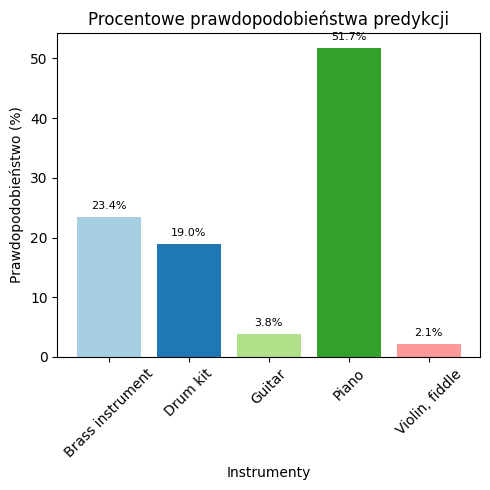

Przewidywany instrument: Piano


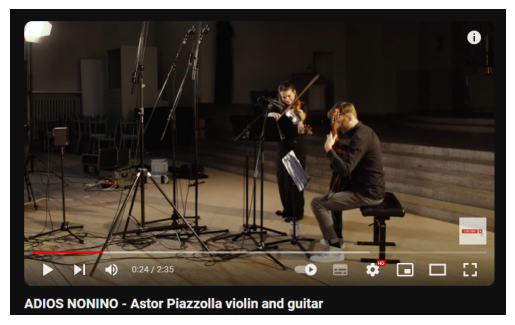

In [177]:
audio_path="C:/Users/filip/Documents/Audacity/adios nonino violin and guitar 0-10.wav"
predicted_label = predict_instrument(model, audio_path, label_to_index)
print(f"Przewidywany instrument: {predicted_label}")
plt.imshow(plt.imread("violin and guitar.png")); plt.axis('off'); plt.show()
audible=glob("C:/Users/filip/Documents/Audacity/adios nonino violin and guitar 0-10.wav")
ipd.Audio(audible[0])

1/1 [==============================] - 0s 48ms/step


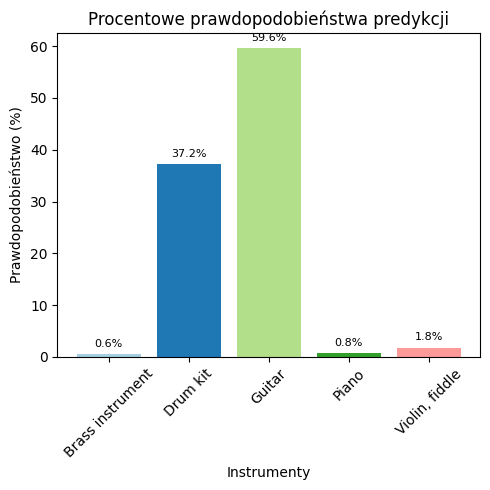

Przewidywany instrument: Guitar


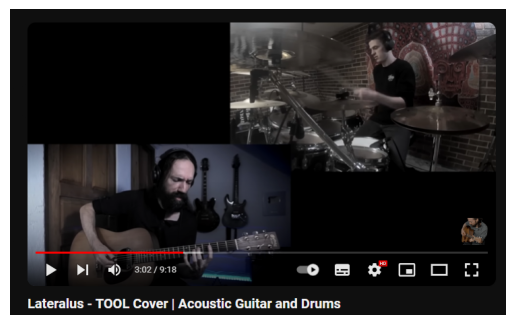

In [178]:
audio_path="C:/Users/filip/Documents/Audacity/guitar and drum 3-3_10.wav"
predicted_label = predict_instrument(model, audio_path, label_to_index)
print(f"Przewidywany instrument: {predicted_label}")
audible=glob("C:/Users/filip/Documents/Audacity/guitar and drum 3-3_10.wav")
plt.imshow(plt.imread("guitar and drums.png")); plt.axis('off'); plt.show()
ipd.Audio(audible[0])